In [1]:
import os
import zipfile
import shutil
import torch
import torchvision
from torch.utils.data import Dataset, DataLoader

import cv2
import numpy as np
from model import StereoCNN
from sa_model import BaselineStereoCNN, SegStereoCNN, SASegStereoCNN, BaselineStereoCNN2, SASegStereoCNN2, SegStereoCNN2
from tqdm import tqdm
from torchsummary import summary
import argparse
from dataset import StereoDataset, StereoSegmentationDataset
from metrics import calculate_ard_and_gd, evaluate_seg, evaluate_baseline
from transforms import transform_disparity_fn, transform_fn, transform_seg_fn, test_transform_seg_fn, test_transform_fn
import matplotlib.pyplot as plt
from torch.utils.data import Dataset, DataLoader
import numpy as np


In [2]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [3]:
model = BaselineStereoCNN(device)
model.to(device)
if os.path.exists('stereo_cnn_baseline_checkpoint2.checkpoint'):
    print("loading existing checkpoint ...")
    checkpoint = torch.load('stereo_cnn_baseline_checkpoint2.checkpoint')
    model.load_state_dict(checkpoint)


loading existing checkpoint ...


ARD: tensor([[0.9961],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000],
        [0.0000]], device='cuda:0')
GD: tensor(0.0996, device='cuda:0')


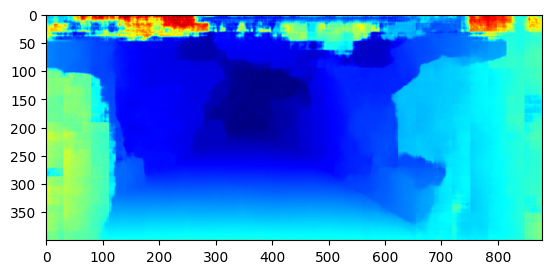

In [4]:
# load left and right images
orig_left_image = cv2.imread('sample/left_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg')
orig_right_img = cv2.imread('sample/right_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg')
orig_ground_truth_disparity = cv2.imread('sample/disparity_maps/2018-10-19-10-33-08_2018-10-19-11-06-02-333.png', cv2.IMREAD_GRAYSCALE)
orig_depth = cv2.imread('sample/depth_maps/2018-10-19-10-33-08_2018-10-19-11-06-02-333.png', cv2.IMREAD_GRAYSCALE)


# resize images
disparity_transform = transform_disparity_fn()
ground_truth_disparity = disparity_transform(orig_ground_truth_disparity).to(device).unsqueeze(0)
orig_depth = disparity_transform(orig_depth).to(device).unsqueeze(0)
min_depth = 0 
max_depth = 80 
r = 4 
interval = 8

model.eval()
with torch.no_grad():
    
    disparity, _ = model.inference(orig_left_image, orig_right_img)

    # calculate ARD and GD
    ard, gd = calculate_ard_and_gd(ground_truth_disparity, disparity, orig_depth, min_depth, max_depth, r, interval, 0, 0)
    print('ARD:', ard)
    print('GD:', gd)
    disparity = disparity.squeeze(0).cpu().numpy()
    disparity = disparity.transpose((1, 2, 0))

    # enhance disparity map
    disparity = cv2.normalize(disparity, None, 0, 255, cv2.NORM_MINMAX)
    disparity = cv2.convertScaleAbs(disparity)
    disparity = cv2.applyColorMap(disparity, cv2.COLORMAP_JET)
    disparity = cv2.cvtColor(disparity, cv2.COLOR_BGR2RGB)
    disparity = cv2.resize(disparity, (orig_left_image.shape[1], orig_left_image.shape[0]))

    # plot disparity map
    plt.imshow(disparity)
    plt.show()
    


    




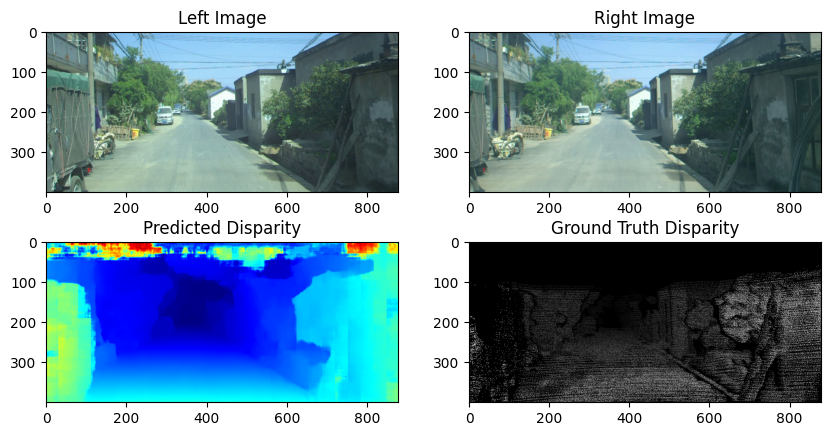

In [5]:
model.eval()
with torch.no_grad():
    disparity, _ = model.inference(orig_left_image, orig_right_img)

    disparity_plt = disparity.squeeze().cpu().numpy()
    left_img_plt = orig_left_image
    right_img_plt = orig_right_img
    ground_truth_disparity_plt = ground_truth_disparity
    
    # # transform disparity so that the farther the object, the darker the pixel
    # disparity_plt = (disparity_plt - disparity_plt.min()) / (disparity_plt.max() - disparity_plt.min())
    # disparity_plt = 1 - disparity_plt

    # ground_truth_disparity_plt = (ground_truth_disparity_plt - ground_truth_disparity_plt.min()) / (ground_truth_disparity_plt.max() - ground_truth_disparity_plt.min())
    # ground_truth_disparity_plt = 1 - ground_truth_disparity_plt

    # enhance disparity map for visualization
    disparity_plt = cv2.normalize(disparity_plt, None, 0, 255, cv2.NORM_MINMAX)
    disparity_plt = cv2.convertScaleAbs(disparity_plt)
    disparity_plt = cv2.applyColorMap(disparity_plt, cv2.COLORMAP_JET)
    disparity_plt = cv2.cvtColor(disparity_plt, cv2.COLOR_BGR2RGB)




    # display side-by-side using matplotlib
    fig, axs = plt.subplots(2, 2, figsize=(10, 5))
    


    left_img_plt = left_img_plt.transpose((1, 2, 0))
    right_img_plt = right_img_plt.transpose((1, 2, 0))
    # left_mask_plt = left_mask_plt.transpose((1, 2, 0))

    # fix the color of the images for matplotlib
    orig_left_image = cv2.cvtColor(orig_left_image, cv2.COLOR_BGR2RGB)
    orig_right_img = cv2.cvtColor(orig_right_img, cv2.COLOR_BGR2RGB)
    # left_mask_plt = cv2.cvtColor(left_mask_plt, cv2.COLOR_BGR2RGB)

    axs[0][0].imshow(orig_left_image)
    axs[0][0].set_title('Left Image')
    axs[0][1].imshow(orig_right_img)
    axs[0][1].set_title('Right Image')
    # axs[0][2].imshow(left_mask_plt)
    # axs[0][2].set_title('Segmentation Mask')
    axs[1][0].imshow(disparity_plt, cmap='gray')
    axs[1][0].set_title('Predicted Disparity')
    axs[1][1].imshow(orig_ground_truth_disparity, cmap='gray')
    axs[1][1].set_title('Ground Truth Disparity')
    plt.show()

    


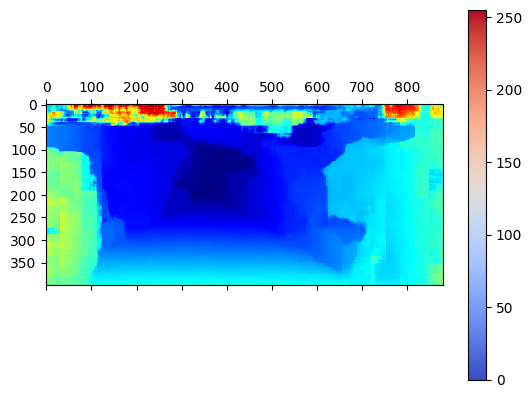

In [6]:
# show the disparity map and allow mouse over to display the disparity value
fig, ax = plt.subplots()

# colr farther object bluer while nearer object is red
cax = ax.matshow(disparity_plt, cmap='coolwarm')
fig.colorbar(cax)

def format_coord(x, y):
    return f'Disparity: {disparity_plt[int(y)][int(x)]:.2f}'
ax.format_coord = format_coord
plt.show()


In [7]:
import re

def load_pfm(file):
    with open(file, 'rb') as f:
        color = None
        width = None
        height = None
        scale = None
        endian = None

        header = f.readline().decode('utf-8').rstrip()
        if header == 'PF':
            color = True
        elif header == 'Pf':
            color = False
        else:
            raise Exception('Not a PFM file.')

        dim_match = re.match(r'^(\d+)\s(\d+)\s$', f.readline().decode('utf-8'))
        if dim_match:
            width, height = map(int, dim_match.groups())
        else:
            raise Exception('Malformed PFM header.')

        scale = float(f.readline().decode('utf-8').rstrip())
        if scale < 0:  # little-endian
            endian = '<'
            scale = -scale
        else:
            endian = '>'  # big-endian

        disparity = np.fromfile(f, endian + 'f')
        disparity = np.reshape(disparity, (height, width))

        return disparity
    
def show_disparity(target_model, left_img, right_img, disparity_map, title='baseline'):
    # load left and right images
    orig_left_image = cv2.imread(left_img)
    orig_right_img = cv2.imread(right_img)

    if disparity_map is not None:
        # check if pfm file
        if disparity_map.endswith('.pfm'):
            orig_ground_truth_disparity = load_pfm(disparity_map)
            # resize
            orig_ground_truth_disparity = cv2.resize(orig_ground_truth_disparity, (879, 400))
            # flip image vertically
            orig_ground_truth_disparity = cv2.flip(orig_ground_truth_disparity, 0)
            
        else:
            orig_ground_truth_disparity = cv2.imread(disparity_map, cv2.IMREAD_GRAYSCALE)
            # resize
            orig_ground_truth_disparity = cv2.resize(orig_ground_truth_disparity, (879, 400))

            # enhance disparity map by making its histogram equalized
            orig_ground_truth_disparity = cv2.equalizeHist(orig_ground_truth_disparity)

            

    # resize images
    disparity_transform = transform_disparity_fn()

    # resize images
    orig_left_image = cv2.resize(orig_left_image, (879, 400))
    orig_right_img = cv2.resize(orig_right_img, (879, 400))

    target_model.eval()

    with torch.no_grad():
        disparity, left_mask = target_model.inference(orig_left_image, orig_right_img)
        disparity_plt = disparity.squeeze().cpu().numpy()

        # enhance disparity map by making its histogram equalized
        disparity_plt = (disparity_plt - disparity_plt.min()) / (disparity_plt.max() - disparity_plt.min())
        disparity_plt = disparity_plt * 255

        # black out the upper part 1/4 of the disparity map
        disparity_plt[:45, :] = 0

        # display side-by-side using matplotlib
        fig, axs = plt.subplots(2, 3, figsize=(30, 10))
        left_img_plt = orig_left_image

        axs[0][0].imshow(left_img_plt)
        axs[0][0].set_title('Left Image')
        axs[0][1].imshow(disparity_plt, cmap='coolwarm')
        axs[0][1].set_title('Predicted Disparity')
        axs[0][2].imshow(orig_ground_truth_disparity, cmap='gray')
        axs[0][2].set_title('Ground Truth Disparity')
        axs[1][0].set_visible(False)
        axs[1][1].set_visible(False)
        axs[1][2].set_visible(False)
        
        if not os.path.exists('test_images'):
            os.makedirs('test_images')
        # save these images for later
        cv2.imwrite(f'test_images/{title}_left_image.png', orig_left_image)
        cv2.imwrite(f'test_images/{title}_disparity.png', disparity_plt)
        cv2.imwrite(f'test_images/{title}_ground_truth_disparity.png', orig_ground_truth_disparity)
        
        if left_mask is not None:
            # rearrange for matplotlib
            left_mask_plt = left_mask.squeeze().cpu().numpy()
            left_mask_plt = left_mask_plt.transpose((1, 2, 0))
            axs[1][0].imshow(left_mask_plt)
            axs[1][0].set_title('Segmentation Mask')
            axs[1][0].set_visible(True)
            cv2.imwrite(f'test_images/{title}_left_mask.png', left_mask_plt * 255)
        plt.show()

def random_from_loader(target_model, loader, title='baseline', segmentation=False):
    loader_iter = iter(loader)

    if segmentation:
        left_image, right_image, left_mask, disparity_map, depth_map, focal_length, baseline = next(loader_iter)
    else:
        left_image, right_image, disparity_map, depth_map, focal_length, baseline = next(loader_iter)
   

    orig_left_image = left_image.squeeze().cpu().numpy()
    orig_left_image = orig_left_image.transpose((1, 2, 0))
    orig_left_image = cv2.cvtColor(orig_left_image, cv2.COLOR_BGR2RGB)

    orig_right_image = right_image.squeeze().cpu().numpy()
    orig_right_image = orig_right_image.transpose((1, 2, 0))
    orig_right_image = cv2.cvtColor(orig_right_image, cv2.COLOR_BGR2RGB)

   
    # enhance disparity map by making its histogram equalized
    orig_ground_truth_disparity = disparity_map.squeeze().cpu().numpy()
    orig_ground_truth_disparity = (orig_ground_truth_disparity - orig_ground_truth_disparity.min()) / (orig_ground_truth_disparity.max() - orig_ground_truth_disparity.min())
    orig_ground_truth_disparity = orig_ground_truth_disparity * 255
    

    

    target_model.eval()

    with torch.no_grad():
        if segmentation:
            input = torch.cat((left_image, right_image, left_mask), 1).to(device)
        else:
            input = torch.cat((left_image, right_image), 1).to(device)
        disparity = target_model(input)
        disparity_plt = disparity.squeeze().cpu().numpy()

        # enhance disparity map by making its histogram equalized
        disparity_plt = (disparity_plt - disparity_plt.min()) / (disparity_plt.max() - disparity_plt.min())
        disparity_plt = disparity_plt * 255

        disparity_plt[0:50,:] = 0


        # display side-by-side using matplotlib
        fig, axs = plt.subplots(2, 3, figsize=(30, 10))
        left_img_plt = orig_left_image

        axs[0][0].imshow(left_img_plt)
        axs[0][0].set_title('Left Image')
        axs[0][1].imshow(disparity_plt, cmap='coolwarm')
        axs[0][1].set_title('Predicted Disparity')
        axs[0][2].imshow(orig_ground_truth_disparity, cmap='gray')
        axs[0][2].set_title('Ground Truth Disparity')
        axs[1][0].set_visible(False)
        axs[1][1].set_visible(False)
        axs[1][2].set_visible(False)
        
        if not os.path.exists('test_images'):
            os.makedirs('test_images')
        # save these images for later
        cv2.imwrite(f'test_images/{title}_left_image.png', orig_left_image)
        cv2.imwrite(f'test_images/{title}_disparity.png', disparity_plt)
        cv2.imwrite(f'test_images/{title}_ground_truth_disparity.png', orig_ground_truth_disparity)
        
        plt.show()


Set the location of the training and test files from the DrivingStereo dataset

In [8]:
data_set_folder = 'tmp/data'

In [9]:
transform = transform_fn()
transform_disparity = transform_disparity_fn()
test_transform = transform_fn()
transform_segmentation = transform_seg_fn()

# load the test images and disparity maps
test_dataset = StereoDataset(f'{data_set_folder}/test/left_images',
                             f'{data_set_folder}/test/right_images',
                             f'{data_set_folder}/test/disparity_maps',
                             f'{data_set_folder}/test/depth_maps',
                             f'calib/test/half-image-calib',
                             transform=test_transform,
                             transform_disparity=transform_disparity)

test_dataloader = DataLoader(test_dataset, batch_size=1, num_workers=1, shuffle=True)

seg_test_dataset = StereoSegmentationDataset(f'{data_set_folder}/test/left_images',
                                             f'{data_set_folder}/test/right_images',
                                             f'{data_set_folder}/test/left_masks',
                                             f'{data_set_folder}/test/disparity_maps',
                                             f'{data_set_folder}/test/depth_maps',
                                             f'calib/test/half-image-calib',
                                             transform=test_transform,
                                             transform_segmentaton=transform_segmentation,
                                             transform_disparity=transform_disparity)

seg_test_dataloader = DataLoader(seg_test_dataset, batch_size=1, num_workers=1, shuffle=True)
# da

Found 7751 left images
Found 7751 right images
Found 7751 disparity maps
Found 7751 depth maps
Found 7751 left images
Found 7751 right images
Found 7751 disparity maps
Found 7751 left masks
Found 7751 depth maps


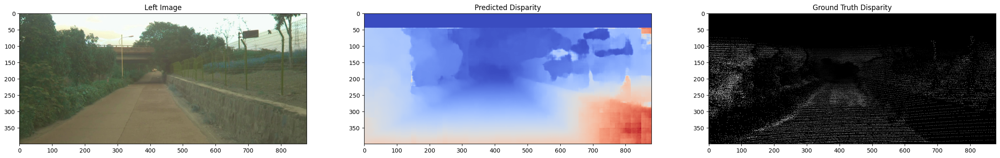

In [10]:
show_disparity(model, 'sample/left_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/right_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/disparity_maps/2018-10-11-16-03-19_2018-10-11-16-58-57-454.png', title='baseline_stereo')

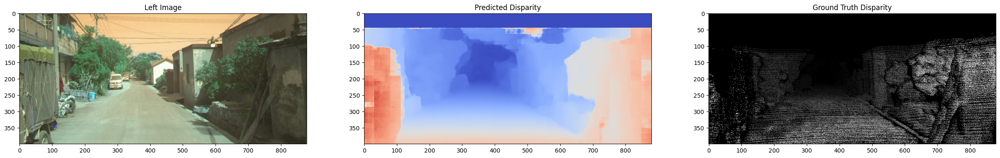

In [11]:
show_disparity(model, 'sample/left_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/right_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/disparity_maps/2018-10-19-10-33-08_2018-10-19-11-06-02-333.png', title='baseline_stereo2')

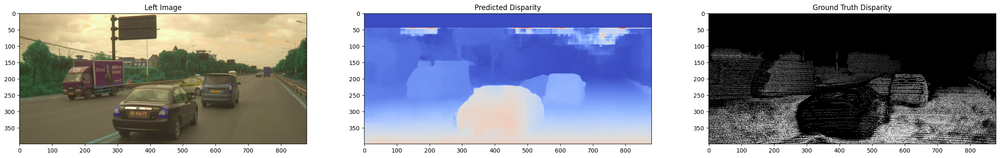

In [12]:
show_disparity(model, 'sample/left_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/right_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/disparity_maps/2018-07-11-14-48-52_2018-07-11-14-50-22-775.png', title='baseline_stereo3')

Performance on other dataset

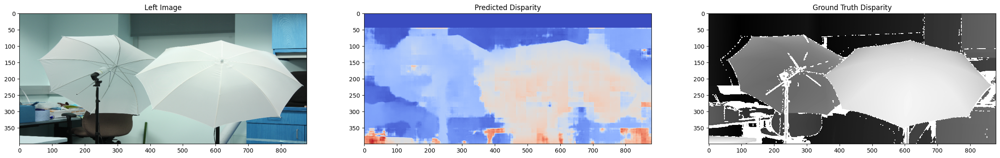

In [13]:
show_disparity(model, 'sample/umbrella/im0.png',
               'sample/umbrella/im1.png',
               'sample/umbrella/disp0.pfm', title='baseline_mulburry_umbrella')

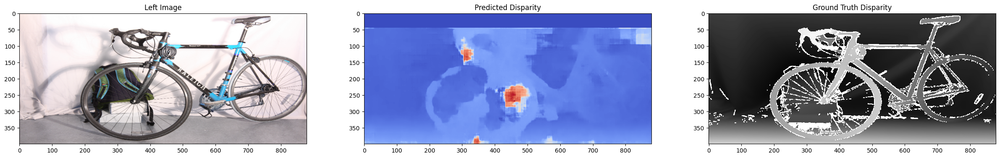

In [14]:
show_disparity(model, 'sample/bicycle/im0.png',
               'sample/bicycle/im1.png',
               'sample/bicycle/disp0.pfm', title='baseline_mulburry_bicycle')

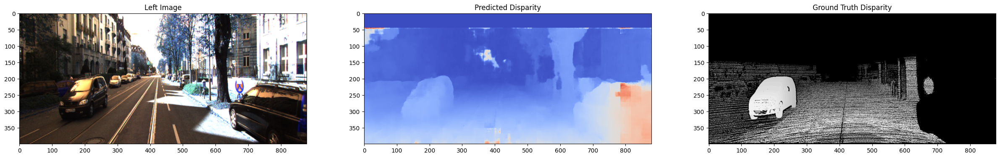

In [15]:
show_disparity(model, 'data/kitti2015/data_scene_flow/training/image_2/000000_10.png',
               'data/kitti2015/data_scene_flow/training/image_3/000000_10.png',
               'data/kitti2015/data_scene_flow/training/disp_occ_0/000000_10.png', title='baseline_ktti')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


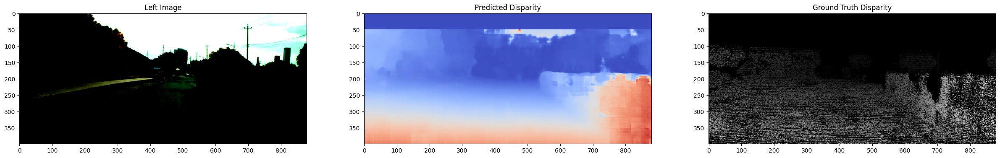

In [16]:
random_from_loader(model, test_dataloader, title='baseline_random')

SEG model

In [17]:
seg_model = SegStereoCNN2(device, load_sam=True)
seg_model.to(device)
seg_model.load_state_dict(torch.load('stereo_cnn_seg_checkpoint.checkpoint'))

<All keys matched successfully>

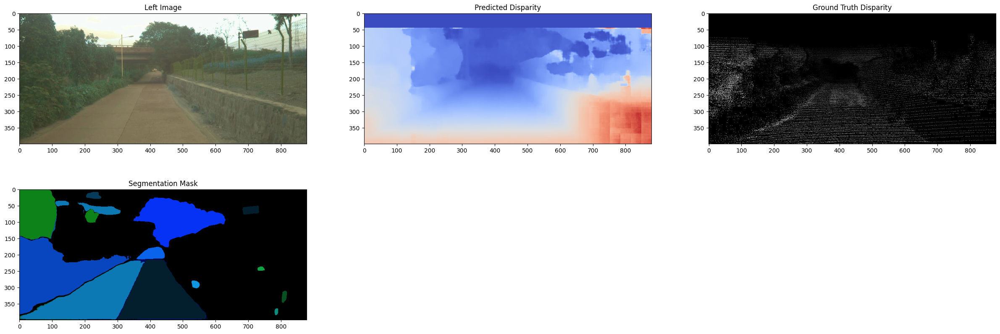

In [18]:
show_disparity(seg_model, 'sample/left_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/right_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/disparity_maps/2018-10-11-16-03-19_2018-10-11-16-58-57-454.png', title='seg_stereo')

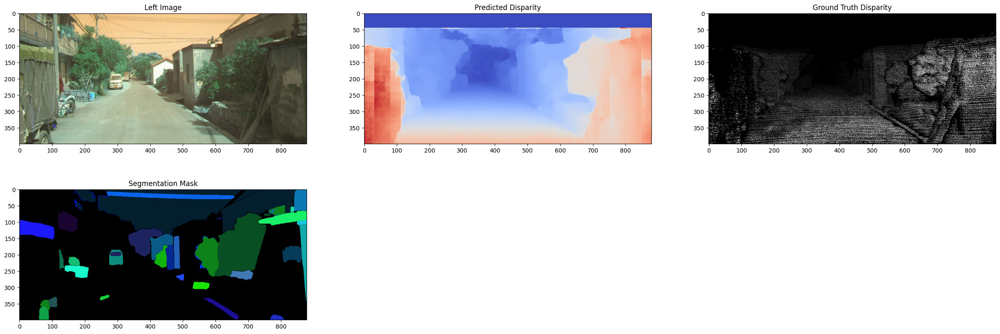

In [19]:
show_disparity(seg_model, 'sample/left_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/right_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/disparity_maps/2018-10-19-10-33-08_2018-10-19-11-06-02-333.png', title='seg_stereo2')

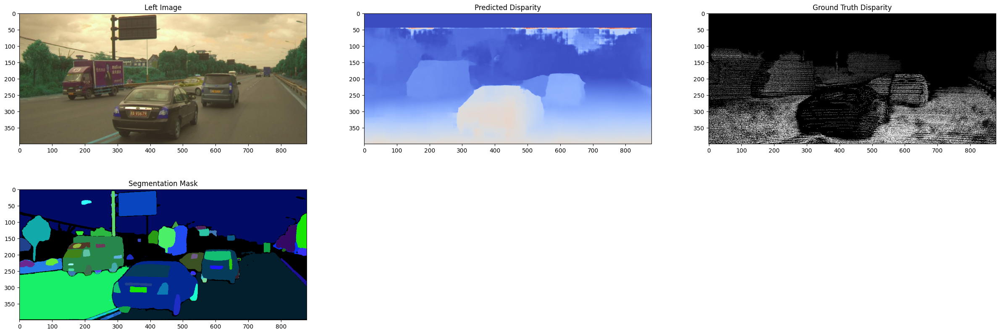

In [20]:
show_disparity(seg_model, 'sample/left_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/right_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/disparity_maps/2018-07-11-14-48-52_2018-07-11-14-50-22-775.png', title='seg_stereo3')

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


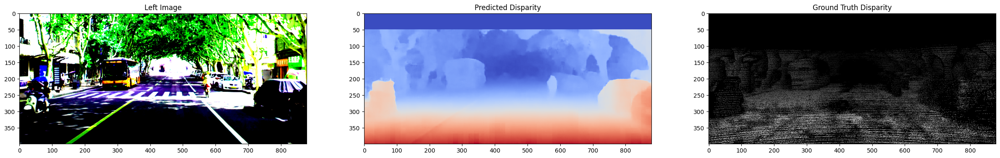

In [21]:
random_from_loader(seg_model, seg_test_dataloader,  title='seg_random', segmentation=True)

Middlebury

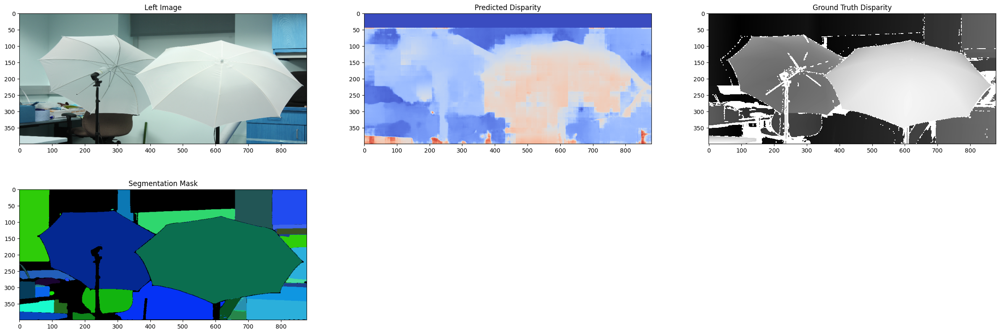

In [22]:
show_disparity(seg_model, 'sample/umbrella/im0.png',
               'sample/umbrella/im1.png',
               'sample/umbrella/disp0.pfm', title='seg_mulburry_umbrella')

KTTI dataset

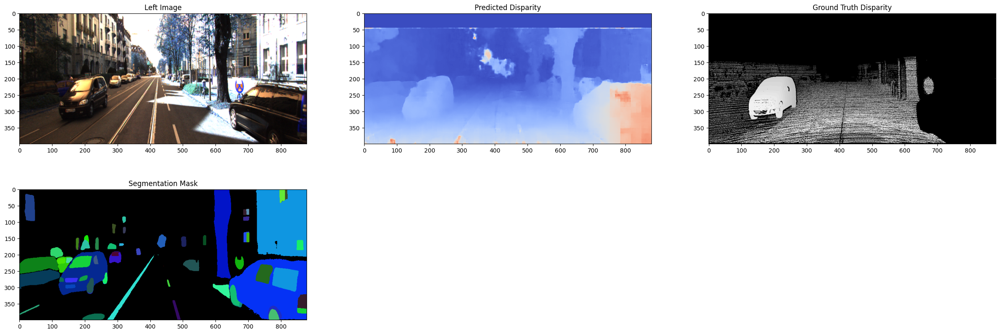

In [23]:
show_disparity(seg_model, 'data/kitti2015/data_scene_flow/training/image_2/000000_10.png',
               'data/kitti2015/data_scene_flow/training/image_3/000000_10.png',
               'data/kitti2015/data_scene_flow/training/disp_occ_0/000000_10.png', title='seg_ktti')

SEG-SA model

In [24]:
sa_seg_model = SASegStereoCNN2(device, load_sam=True)
sa_seg_model.to(device)
sa_seg_model.load_state_dict(torch.load('stereo_cnn_sa_seg_checkpoint.checkpoint'))

<All keys matched successfully>

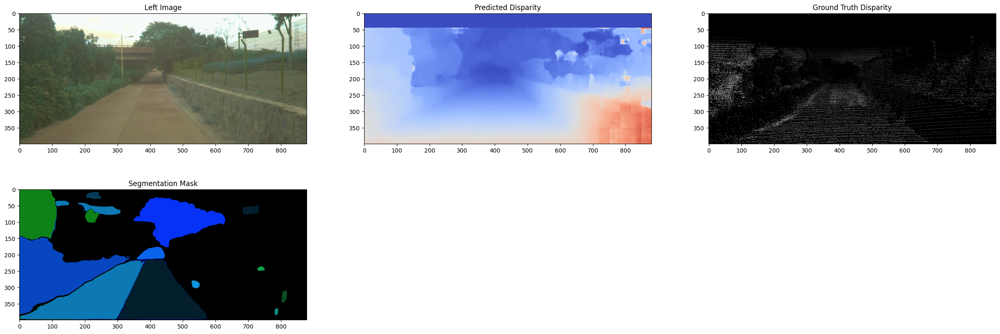

In [25]:
show_disparity(sa_seg_model, 'sample/left_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/right_images/2018-10-11-16-03-19_2018-10-11-16-58-57-454.jpg',
               'sample/disparity_maps/2018-10-11-16-03-19_2018-10-11-16-58-57-454.png', title='sa_seg_stereo')

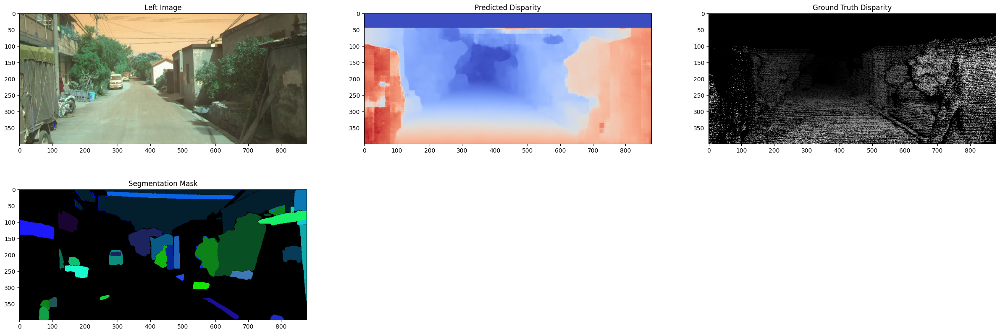

In [26]:
show_disparity(sa_seg_model, 'sample/left_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/right_images/2018-10-19-10-33-08_2018-10-19-11-06-02-333.jpg',
               'sample/disparity_maps/2018-10-19-10-33-08_2018-10-19-11-06-02-333.png', title='sa_seg_stereo2')

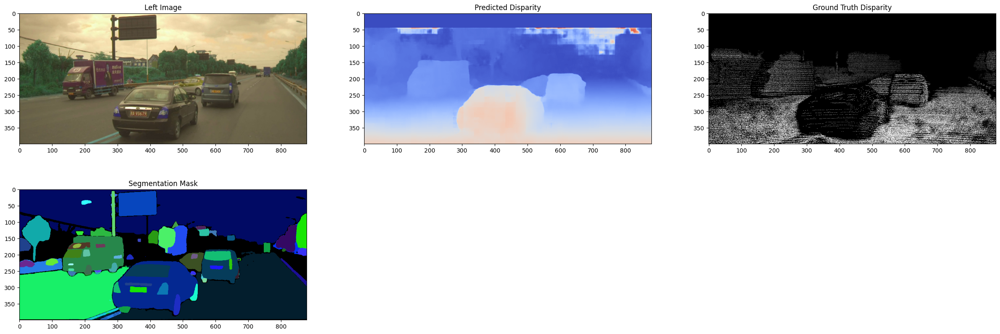

In [27]:
show_disparity(sa_seg_model, 'sample/left_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/right_images/2018-07-11-14-48-52_2018-07-11-14-50-22-775.jpg',
               'sample/disparity_maps/2018-07-11-14-48-52_2018-07-11-14-50-22-775.png', title='sa_seg_stereo3')

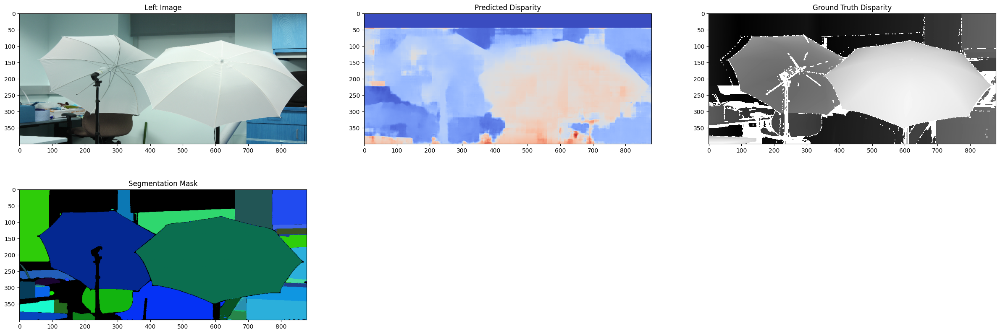

In [28]:
show_disparity(sa_seg_model, 'sample/umbrella/im0.png',
               'sample/umbrella/im1.png',
               'sample/umbrella/disp0.pfm', title='sa_seg_mulburry_umbrella')

KTTI

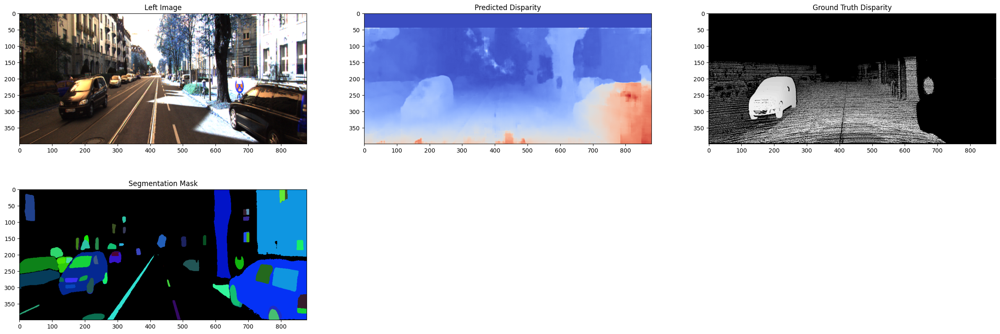

In [29]:
show_disparity(sa_seg_model, 'data/kitti2015/data_scene_flow/training/image_2/000000_10.png',
               'data/kitti2015/data_scene_flow/training/image_3/000000_10.png',
               'data/kitti2015/data_scene_flow/training/disp_occ_0/000000_10.png', title='sa_seg_ktti')

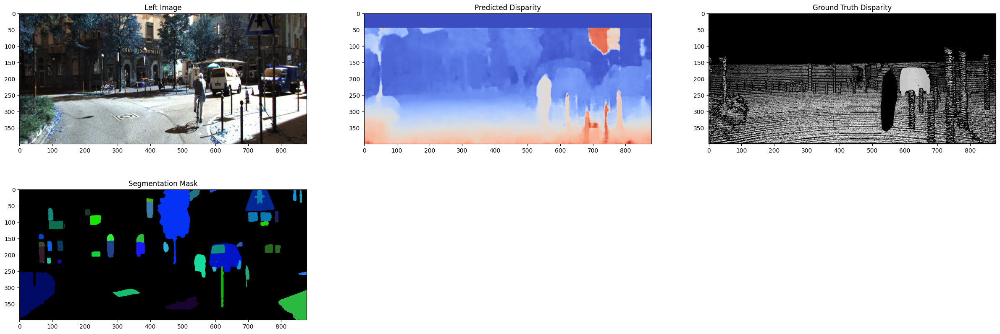

In [30]:
show_disparity(sa_seg_model, 'data/kitti2015/data_scene_flow/training/image_2/000003_10.png',
               'data/kitti2015/data_scene_flow/training/image_3/000003_10.png',
               'data/kitti2015/data_scene_flow/training/disp_occ_0/000003_10.png', title='sa_seg_ktti')

Comaprison of the 3 models

Comparison using the GD metric

In [31]:
BATCH_SIZE = 8
NUM_WORKERS = 4

data_set_folder = 'tmp/data'

transform = test_transform_fn()
transform_disparity = transform_disparity_fn()
transform_segmentation = transform_seg_fn()

# load the test images and disparity maps
test_dataset = StereoDataset(f'{data_set_folder}/test/left_images',
                             f'{data_set_folder}/test/right_images',
                             f'{data_set_folder}/test/disparity_maps',
                             f'{data_set_folder}/test/depth_maps',
                             f'calib/test/half-image-calib',
                             transform=test_transform,
                             transform_disparity=transform_disparity)

test_dataloader = DataLoader(test_dataset, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=False)

# load the test images and disparity maps
seg_test_dataset = StereoSegmentationDataset(f'{data_set_folder}/test/left_images',
                             f'{data_set_folder}/test/right_images',
                             f'{data_set_folder}/test/left_masks',
                             f'{data_set_folder}/test/disparity_maps',
                             f'{data_set_folder}/test/depth_maps',
                             f'calib/test/half-image-calib',
                             transform=transform,
                             transform_disparity=transform_disparity,
                             transform_segmentaton=transform_segmentation)

seg_test_dataloader = DataLoader(seg_test_dataset, batch_size=BATCH_SIZE, num_workers=NUM_WORKERS, shuffle=False)

def convert_to_latex_plt(ard, num_buckets = 10, interval=8):
    start = 0
    ard = ard.squeeze().cpu().numpy()
    str_output = ""
    for i in range(num_buckets):
        end = start + interval
        str_output += f"({start}, {ard[i]})"
        start = end
    return str_output


Found 7751 left images
Found 7751 right images
Found 7751 disparity maps
Found 7751 depth maps
Found 7751 left images
Found 7751 right images
Found 7751 disparity maps
Found 7751 left masks
Found 7751 depth maps


Baseline metrics

In [32]:
from metrics import calculate_ard_and_gd, evaluate_seg, evaluate_baseline

total_test_loss, total_ard_values, total_gd, total_epe, total_d1 = evaluate_baseline(model, test_dataloader, device)

print(f'D1: {total_d1}')
print(f'EPE: {total_epe}')
print(f'Test Loss: {total_test_loss}')
print(f'Average Absolute Relative Difference: {convert_to_latex_plt(total_ard_values)}')
print(f'Average Global Difference: {total_gd}')

  0%|          | 0/969 [00:00<?, ?it/s]/home/jedld/miniconda3/envs/cs282/lib/python3.12/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 969/969 [02:35<00:00,  6.22it/s]

len: 969
D1: 2.9466537264532664
EPE: 0.9640073180198669
Test Loss: 0.12293531452723701
Average Absolute Relative Difference: (0, 0.0010807631770148873)(8, 0.015713730826973915)(16, 0.020172445103526115)(24, 0.027289744466543198)(32, 0.03439181670546532)(40, 0.04372623935341835)(48, 0.051382116973400116)(56, 0.06333626061677933)(64, 0.07598381489515305)(72, 0.08355209231376648)
Average Global Difference: 0.041662897914648056


Segmentation Metrics

In [33]:
seg_total_test_loss, seg_total_ard_values, seg_total_gd, total_epe, total_d1 = evaluate_seg(seg_model, seg_test_dataloader, device, title='Segmentation')
print(f'D1: {total_d1}')
print(f'EPE: {total_epe}')
print(f'Test Loss: {seg_total_test_loss}')
print(f'Average Absolute Relative Difference: {convert_to_latex_plt(seg_total_ard_values)}')
print(f'Average Global Difference: {seg_total_gd}')

100%|██████████| 969/969 [02:18<00:00,  6.98it/s]


D1: 2.6531750623376777
EPE: 0.9245556592941284
Test Loss: 0.11527787831345702
Average Absolute Relative Difference: (0, 0.0011129113845527172)(8, 0.01558353565633297)(16, 0.019070925191044807)(24, 0.02628743276000023)(32, 0.03179971128702164)(40, 0.04038020968437195)(48, 0.051282212138175964)(56, 0.05763963982462883)(64, 0.061169035732746124)(72, 0.06474965065717697)
Average Global Difference: 0.03690752014517784


SA-Segmentation Metrics

In [34]:
sa_seg_total_test_loss, sa_seg_total_ard_values, sa_seg_total_gd, sa_seg_epe, sa_seg_d1 = evaluate_seg(sa_seg_model, seg_test_dataloader, device, title='SA_Segmentation')
print(f'D1: {sa_seg_d1}')
print(f'EPE: {sa_seg_epe}')
print(f'Test Loss: {sa_seg_total_test_loss}')
print(f'Average Absolute Relative Difference: {convert_to_latex_plt(sa_seg_total_ard_values)}')
print(f'Average Global Difference: {sa_seg_total_gd}')

100%|██████████| 969/969 [02:19<00:00,  6.94it/s]


D1: 2.958198756813219
EPE: 0.9284363389015198
Test Loss: 0.11575193697792335
Average Absolute Relative Difference: (0, 0.0009535745484754443)(8, 0.015307961963117123)(16, 0.019774941727519035)(24, 0.026445826515555382)(32, 0.03563535585999489)(40, 0.042133696377277374)(48, 0.046495795249938965)(56, 0.0524693988263607)(64, 0.06097172945737839)(72, 0.07278666645288467)
Average Global Difference: 0.03729749843478203
